In [1]:
import pandas as pd
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score,silhouette_samples
import plotly.express as px
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
import matplotlib.cm as cm
import numpy as np
import random
random.seed(1)

In [2]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')

If the true label is not known in advance, then K-Means clustering can be evaluated using either Elbow Criterion or Silhouette Coefficient.

# Elbow Criterion Method

The idea behind elbow method is to run k-means clustering on a given dataset for a range of values of k (num_clusters, e.g k=1 to 10), and for each value of k, calculate sum of squared errors (SSE).

After that, plot a line graph of the SSE for each value of k. If the line graph looks like an arm, the "elbow" on the arm is the value of optimal k (number of cluster). Here, we want to minimize SSE. SSE tends to decrease toward 0 as we increase k (and SSE is 0 when k is equal to the number of data points in the dataset, because then each data point is its own cluster, and there is no error between it and the center of its cluster).

So the goal is to choose a small value of k that still has a low SSE, and the elbow usually represents where we start to have diminishing returns by increasing k.

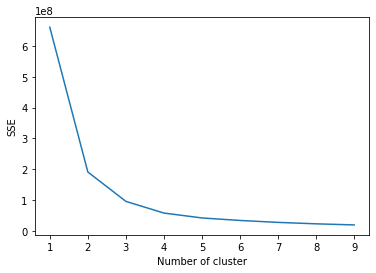

In [3]:
sse = {}
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(df)
    df["clusters"] = kmeans.labels_
    #print(data["clusters"])
    sse[k] = kmeans.inertia_ # Inertia: Sum of distances of samples to their closest cluster center
plt.figure()
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

# Silhouette Coefficient Method

A higher Silhouette Coefficient score relates to a model with better-defined clusters. The Silhouette Coefficient is defined for each sample and is composed of two scores:
a: The mean distance between a sample and all other points in the same class.
b: The mean distance between a sample and all other points in the next nearest cluster.
Now, to find the optimal value of k for KMeans, loop through 1..n for n_clusters in KMeans and calculate Silhouette Coefficient for each sample.
A higher Silhouette Coefficient indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

For n_clusters = 2 The average silhouette_score is : 0.6011934884150237


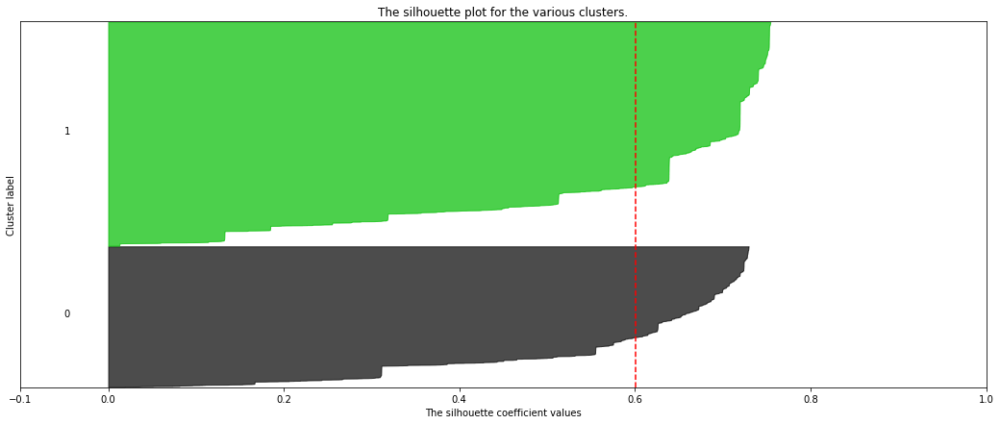

For n_clusters = 3 The average silhouette_score is : 0.5553484273671185


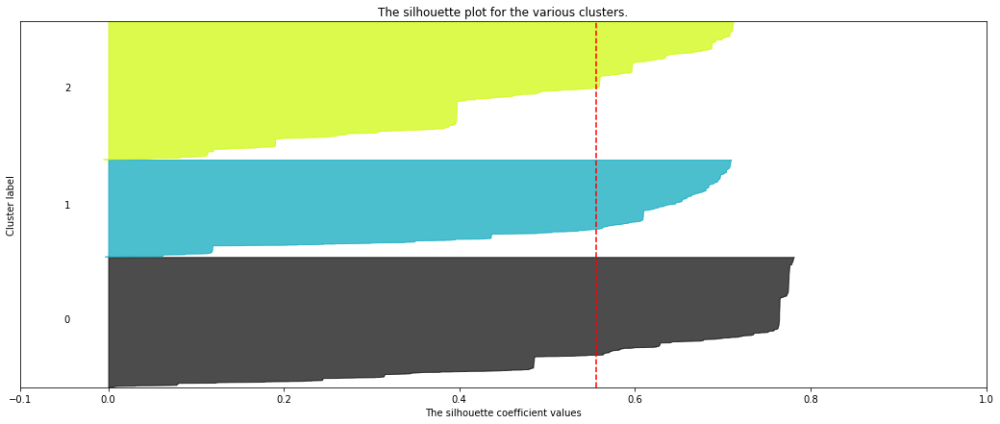

For n_clusters = 4 The average silhouette_score is : 0.547176207637457


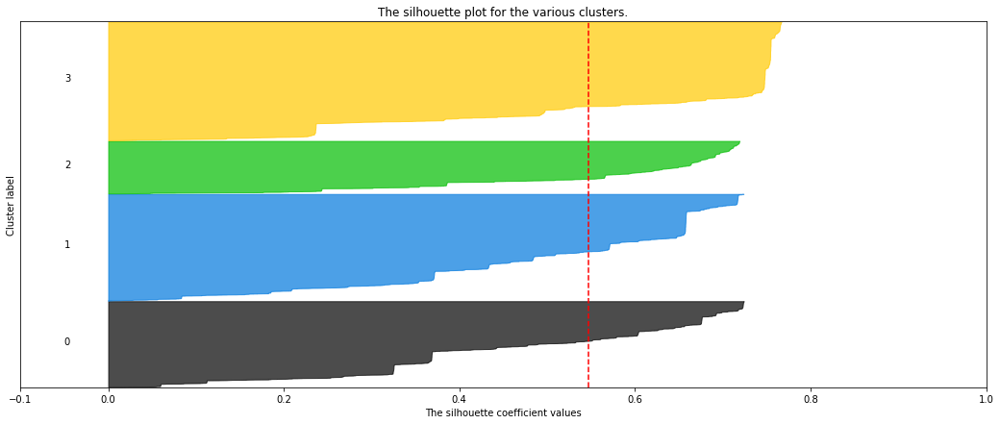

For n_clusters = 5 The average silhouette_score is : 0.5326697894783435


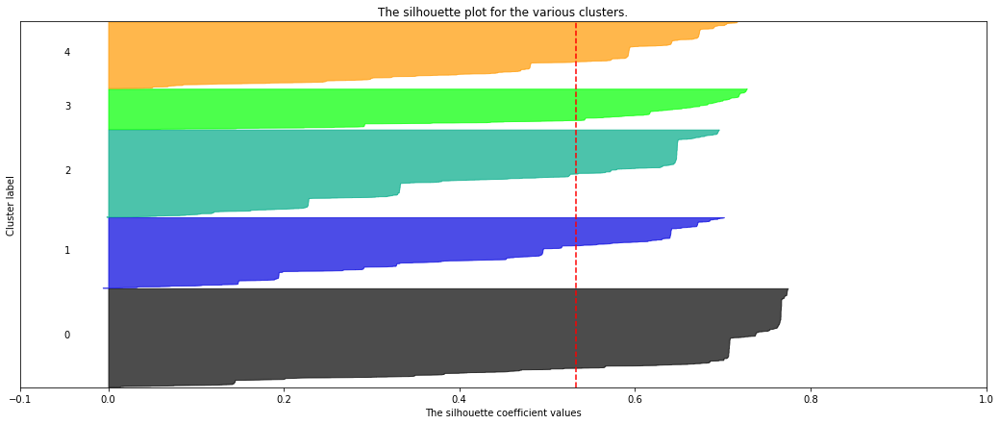

For n_clusters = 6 The average silhouette_score is : 0.5196454552074965


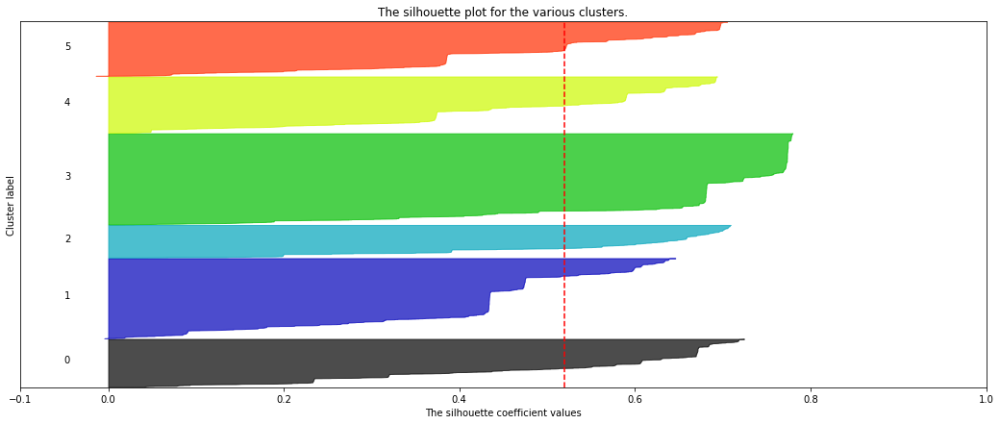

For n_clusters = 7 The average silhouette_score is : 0.5396441872152424


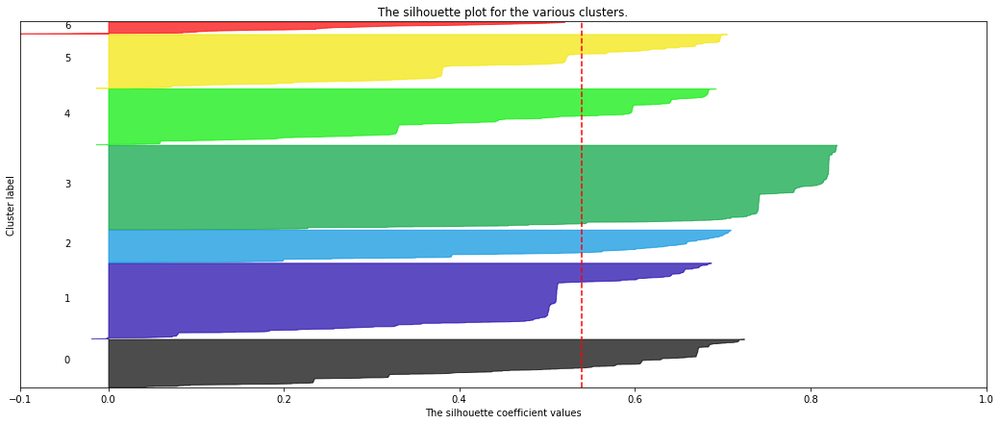

For n_clusters = 8 The average silhouette_score is : 0.5388531149427956


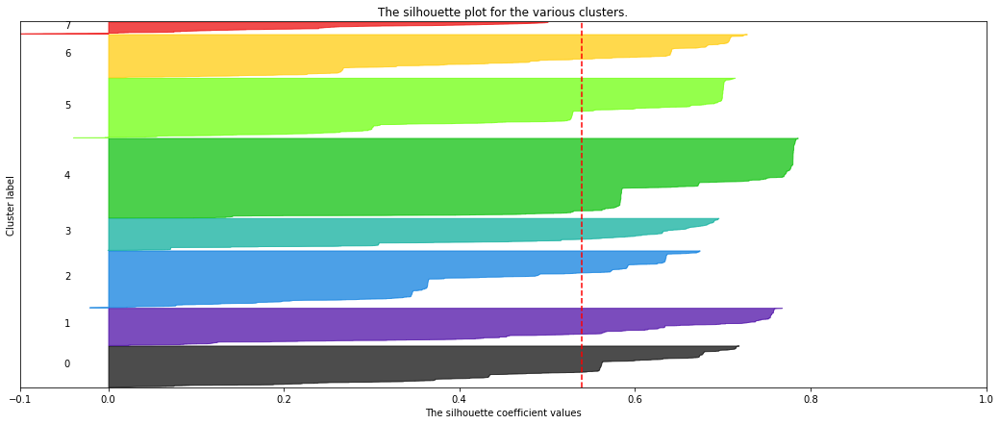

For n_clusters = 9 The average silhouette_score is : 0.522124645835806


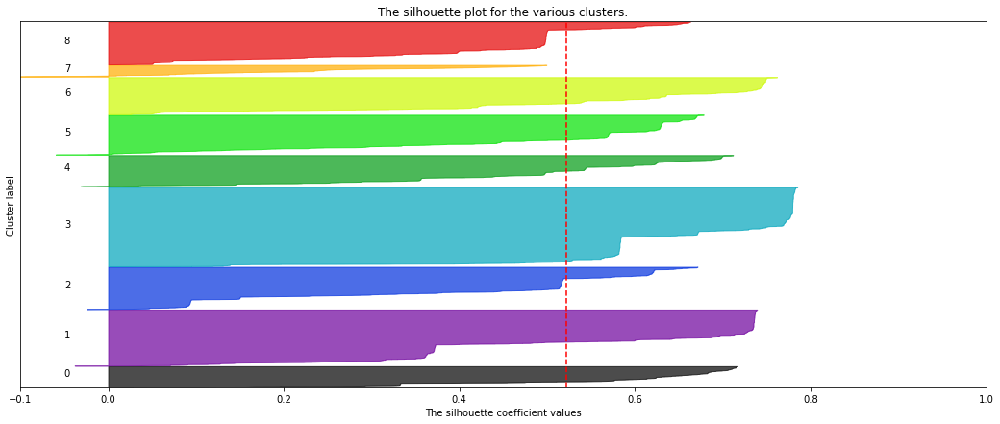

For n_clusters = 10 The average silhouette_score is : 0.5464500224889997


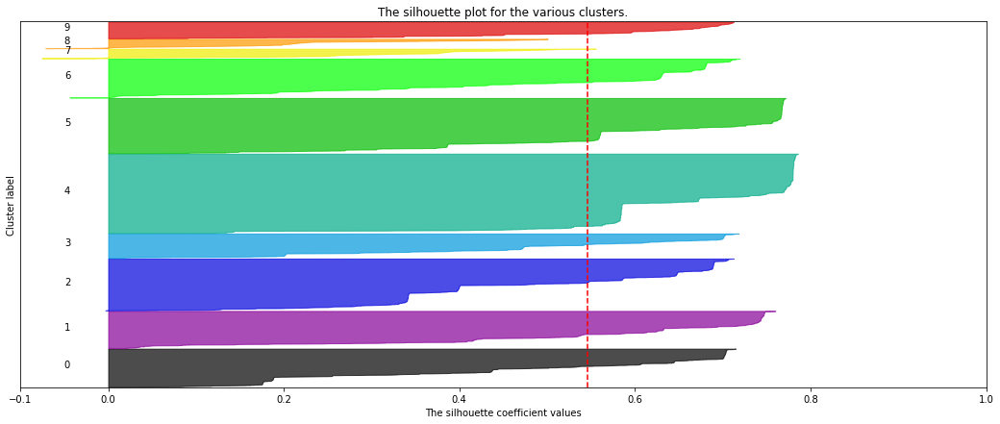

In [14]:
# df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')


# for n_clusters in range(2, 10):
#     clusterer = KMeans(n_clusters=n_clusters)
#     preds = clusterer.fit_predict(df)
#     centers = clusterer.cluster_centers_

#     score = silhouette_score(df, preds)
#     print("For n\_clusters $= {}$, silhouette score is ${}$.".format(n_clusters, score))
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')


X = df.to_numpy()


range_n_clusters = [2, 3, 4, 5, 6,7,8,9,10]
for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    

   

    plt.show()
    

# Let us see how many values are in each cluster for k = 2:

In [2]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
kmeans = KMeans(n_clusters=2, max_iter=1000).fit(df)
df["clusters"] = kmeans.labels_
df["clusters"] = kmeans.labels_
print("Clusters and their sizes")
print(df.clusters.value_counts())
print('Symmetries per cluster')
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/C4_table_without_graphs.csv')\
.drop(['[N,i]', 'name', 'id'], axis=1)

df.worthy = df.worthy.apply(lambda x: 0 if (x == False) else 1)
df.bipartite = df.bipartite.apply(lambda x: 0 if (x == False) else 1)
df['dart-transitive'] = df.transitivity.apply(lambda x: 1 if (x == 'dart-transitive') else 0)
df['semisymmetric'] = df.transitivity.apply(lambda x: 1 if (x == 'semisymmetric') else 0)
df['half-arc-transitive'] = df.transitivity.apply(lambda x: 1 if (x == 'half-arc-transitive') else 0)
df = df.drop('transitivity', axis=1)
df["clusters"] = kmeans.labels_

d = {0:{'semisymmetric':0, 'half-arc-transitive':0, 'dart-transitive':0}, 
     1:{'semisymmetric':0, 'half-arc-transitive':0, 'dart-transitive':0}}

for i in range(len(df)):
    if df.iloc[i,-1] == 0:
        d[0]['semisymmetric'] += df.iloc[i,-3]
        d[0]['half-arc-transitive'] += df.iloc[i,-2]
        d[0]['dart-transitive'] += df.iloc[i,-4]
    else:
        d[1]['semisymmetric'] += df.iloc[i,-3]
        d[1]['half-arc-transitive'] += df.iloc[i,-2]
        d[1]['dart-transitive'] += df.iloc[i,-4]    
        
d

Clusters and their sizes
1    4525
0    2839
Name: clusters, dtype: int64
Symmetries per cluster


{0: {'semisymmetric': 944,
  'half-arc-transitive': 295,
  'dart-transitive': 1600},
 1: {'semisymmetric': 1935,
  'half-arc-transitive': 625,
  'dart-transitive': 1965}}

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D

In [16]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = kmeans.labels_


In [17]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters")
fig.show()

# 3D

In [18]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = kmeans.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters")
fig.show()

## Table

In [9]:
# make sure that you run all the cells where k=2
C4 = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/C4_table_without_graphs.csv')
merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: red']*len(s)
    else:
        return ['background-color: purple']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)

# Let us see how many values are in each cluster for k = 3:

In [3]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
kmeans = KMeans(n_clusters=3, max_iter=1000).fit(df)
df["clusters"] = kmeans.labels_
print("Clusters and their sizes")
print(df.clusters.value_counts())
print('Symmetries per cluster')
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/C4_table_without_graphs.csv')\
.drop(['[N,i]', 'name', 'id'], axis=1)

df.worthy = df.worthy.apply(lambda x: 0 if (x == False) else 1)
df.bipartite = df.bipartite.apply(lambda x: 0 if (x == False) else 1)
df['dart-transitive'] = df.transitivity.apply(lambda x: 1 if (x == 'dart-transitive') else 0)
df['semisymmetric'] = df.transitivity.apply(lambda x: 1 if (x == 'semisymmetric') else 0)
df['half-arc-transitive'] = df.transitivity.apply(lambda x: 1 if (x == 'half-arc-transitive') else 0)
df = df.drop('transitivity', axis=1)
df["clusters"] = kmeans.labels_

d = {0:{'semisymmetric':0, 'half-arc-transitive':0, 'dart-transitive':0}, 
     1:{'semisymmetric':0, 'half-arc-transitive':0, 'dart-transitive':0}, 
     2:{'semisymmetric':0, 'half-arc-transitive':0, 'dart-transitive':0}}

for i in range(len(df)):
    if df.iloc[i,-1] == 0:
        d[0]['semisymmetric'] += df.iloc[i,-3]
        d[0]['half-arc-transitive'] += df.iloc[i,-2]
        d[0]['dart-transitive'] += df.iloc[i,-4]
    elif df.iloc[i,-1] == 1:
        d[1]['semisymmetric'] += df.iloc[i,-3]
        d[1]['half-arc-transitive'] += df.iloc[i,-2]
        d[1]['dart-transitive'] += df.iloc[i,-4]   
    else:
        d[2]['semisymmetric'] += df.iloc[i,-3]
        d[2]['half-arc-transitive'] += df.iloc[i,-2]
        d[2]['dart-transitive'] += df.iloc[i,-4]
        
d

Clusters and their sizes
0    2776
1    2628
2    1960
Name: clusters, dtype: int64
Symmetries per cluster


{0: {'semisymmetric': 1108,
  'half-arc-transitive': 336,
  'dart-transitive': 1332},
 1: {'semisymmetric': 1146,
  'half-arc-transitive': 386,
  'dart-transitive': 1096},
 2: {'semisymmetric': 625,
  'half-arc-transitive': 198,
  'dart-transitive': 1137}}

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D

In [20]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = kmeans.labels_


In [21]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters")
fig.show()

### 3D

In [22]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = kmeans.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters")
fig.show()

## Table

In [14]:
# make sure that you run all the cells where k=3
C4 = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/C4_table_without_graphs.csv')
merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: green']*len(s)
    elif s.clusters == 1:
        return ['background-color: purple']*len(s)
    else:
        return ['background-color: red']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)

# Let us see how many values are in each cluster for k = 4:

In [15]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
kmeans = KMeans(n_clusters=4, max_iter=1000).fit(df)
df["clusters"] = kmeans.labels_
df.clusters.value_counts()

1    2400
0    2163
3    1736
2    1065
Name: clusters, dtype: int64

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D

In [16]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = kmeans.labels_


In [17]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters",
                title = "K-means clustering (k=4), 2 PCA components")
fig.show()

### 3D

In [18]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = kmeans.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters",
                title = "K-means clustering (k=4), 3 PCA components")
fig.show()

## Table

In [19]:
# make sure that you run all the cells where k=4
C4 = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/C4_table_without_graphs.csv')
merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: blue']*len(s)
    elif s.clusters == 1:
        return ['background-color: purple']*len(s)
    elif s.clusters == 2:
        return ['background-color: green']*len(s)
    else:
        return ['background-color: red']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)

# Let us see how many values are in each cluster for k = 5:

In [20]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
kmeans = KMeans(n_clusters=5, max_iter=1000).fit(df)
df["clusters"] = kmeans.labels_
df.clusters.value_counts()

0    2000
4    1835
2    1489
1    1245
3     795
Name: clusters, dtype: int64

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D 

In [21]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = kmeans.labels_


In [22]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters",
                title = "K-means clustering (k=5), 2 PCA components")
fig.show()

### 3D

In [23]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = kmeans.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters",
                title = "K-means clustering (k=5), 3 PCA components")
fig.show()

## Table

In [24]:
# make sure that you run all the cells where k=5
C4 = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/C4_table_without_graphs.csv')
merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: green']*len(s)
    elif s.clusters == 1:
        return ['background-color: orange']*len(s)
    elif s.clusters == 2:
        return ['background-color: blue']*len(s)
    elif s.clusters == 3:
        return ['background-color: purple']*len(s)
    else:
        return ['background-color: red']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)

# Let us see how many values are in each cluster for k = 6:

In [25]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
kmeans = KMeans(n_clusters=6, max_iter=1000).fit(df)
df["clusters"] = kmeans.labels_
df.clusters.value_counts()

0    2000
2    1766
5    1197
1     898
4     847
3     656
Name: clusters, dtype: int64

## Visualization

We will use PCA, number of component will be 2 and 3 so we can see 2D and 3D visualizations.

### 2D

In [26]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=2)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2'])
principalDf["clusters"] = kmeans.labels_


In [27]:
principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter(principalDf, x='principal component 1', y='principal component 2', color="clusters",
                title = "K-means clustering (k=6), 2 PCA components")
fig.show()

### 3D 

In [28]:
df = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/to_be_clustered_data_log.csv')
X_std = StandardScaler().fit_transform(df)

pca = PCA(n_components=3)
principalComponents = pca.fit_transform(X_std)

principalDf = pd.DataFrame(data = principalComponents, columns = ['principal component 1', 'principal component 2', 'principal component 3'])
principalDf["clusters"] = kmeans.labels_

principalDf["clusters"] = principalDf["clusters"].astype(str)
fig = px.scatter_3d(principalDf, x='principal component 1', y='principal component 2', z = 'principal component 3', color="clusters",
                title = "K-means clustering (k=6), 3 PCA components")
fig.show()

## Table

In [29]:
# make sure that you run all the cells where k=6
C4 = pd.read_csv('/home/lisi/Desktop/SeminarStuff/Data/C4_table_without_graphs.csv')
merged_df = pd.concat([C4, principalDf], axis=1, sort=False)
merged_df['clusters'] = merged_df['clusters'].astype(int)

def highlight(s):
    if s.clusters == 0:
        return ['background-color: orange']*len(s)
    elif s.clusters == 1:
        return ['background-color: blue']*len(s)
    elif s.clusters == 2:
        return ['background-color: green']*len(s)
    elif s.clusters == 3:
        return ['background-color: red']*len(s)
    elif s.clusters == 4:
        return ['background-color: cyan']*len(s)
    else:
        return ['background-color: purple']*len(s)

# Remove the comment below and run it to see the table    
#merged_df.style.apply(highlight, axis=1)